## <div style='text-align: justify;'> Hello, welcome to my project that I've been working on for few months. The project is all about GAN (Generative Adverserial Network), different  versions of the architecture and how this network is able to generate new data that is almost as simillar as the real data. Before we dive into the discussion, I need to remind whoever reads this notebook that the project is still ongoing and the final outcome for this project hasn't finished yet. </div>

## What is Generative Adversarial Network?

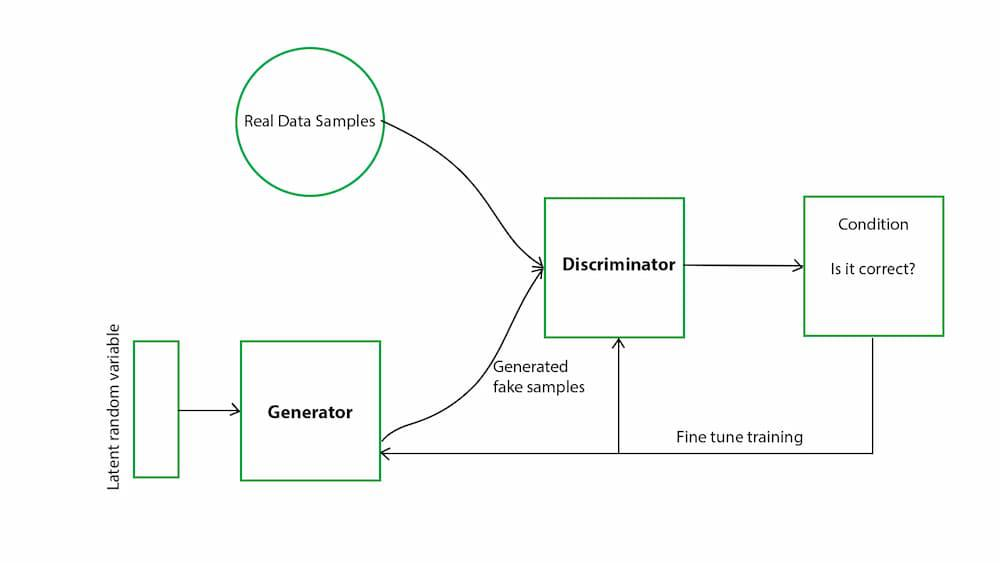

**_Source_**: [Link](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.geeksforgeeks.org%2Fgenerative-adversarial-network-gan%2F&psig=AOvVaw3oo4v3UjBD_4GOFhq2FK1F&ust=1705379780426000&source=images&cd=vfe&opi=89978449&ved=0CBIQjRxqFwoTCLiIhfLI3oMDFQAAAAAdAAAAABAD)

<div style='text-align: justify;'> 
Generative Adversarial Network or GAN for short is a Neural Network Architecture that consists 2 main components that are Generator and Discriminator. The Generator task is to fool the Discriminator enough that the Discriminator can't determine whether the generated data is real or not in other words the generated data is almost as similar as real data. The Discriminator task is to be able distinguish a real or fake data (generated data from the generator). These 2 components will compete to each other where generator is keep trying to fool the discriminator and the discriminator is trying not to be fooled that is why it is called adversarial network.

In real life, there are many applications that can be done by using this network. Here are several GAN real life applications: 

1. **Image Synthesis**. GAN can be used for Artistice Style Transfer where you can combine 2 image style into one new image that has both parents characteristics.
2. **Data Augmentaion**. GAN can be used for improving Machine Learning model through generating new samples for the model to train on  This will reduce our time to gather new data and just use existing data for the base of generated images from GAN.
3. **Image-to-Image Translation**. GAN can be used for transfer one image domain to another domain for example from RGB image into black and white image. Moreover, GAN can turn blurred image into high realistic image.
4. **Drug Discovery**. GAN can be used for generating new combination of molecular structures that will help scientist to discover new drug and identify potential new compounds with desired properties.
5. **Anomaly Detection**. GAN can be used for generating new data based on the real distribution and any deviation from the generated data can be flagged as anomalies.

There are still many applications regrading to GAN but in this project we will be focused on the Image Generation and how to build state of the art GAN for image generation. </div>

## Process to Train GAN

<div style='text-align: justify;'> 
In this section, I wil try to explain how to train GAN and how this network works to produce such new data that is almost as similiar as the real data. First, we need to build the generator  and dicriminator architecture. The Generator usually consists of Deep Neural Network such as Transpose Convolution layers that will construct $z$ latent random variable into the desired dimension or as same as the real data. The Discriminator usually consist of Deep Convlotion layers and 1 Dense layer for the output. Note that the architecture of this netwok will not always be the same since there are many papers that proposed different architecture for certain cases which i will explain it later. Now, I will break the process into a list so you can understand it more clearly. Here are the following steps:

1. generate sample noise $z$ from normal distribution or uniform distribution with the disired dimensions.
2. the generated noise will be fed into the generator that will output data (image) that has same dimension as the real image.
3. Before we feed the fake and real data into the Discriminator, we will have to label the fake image and real image accordingly.
4. After the data are labeled, we can procced to feed our data into the Discriminator.
5. Then, the Discriminator will output the prediction in logits state.
6. Next, we will calculate the loss from the actual label usually with Binary Cross Entropy Loss Function and we can do backpropagation from the derived gradients also update the Disciminator parameters. **Note** : first wee need to train the Discriminator and then the Generator. Moreover, in this step we need to make sure that the Generator is locked (frozen) so that we only train the Discriminator.
7. After we have done training the Discriminator, we need to train the Generator based on the fake (generated) image but we need to label the data with 1 to tell the Generator that the generated image is a real image so that the generator can produce more images that look as similar as the real data.
8. This process called min max games which means the discriminator will try to minimize its loss while the generator will try tor maximize the discriminator loss.
9. Last, we need to do redo the previous steps in several epochs or until the generated images are as similliar as the real data that the discriminator cant distinguish which one is a real or fake image.
</div>

## Advantages and Disadvantages of GANs. Alternative to GANs

There are several advantages and disadvantages of GAN that may take into consideration. Here is the list:

- **Advatages**:
    - Able to generate realistic images.
    - Fast Inference.
    - Inovative Application.
    - Can be used for unsupervised learning.

<br>

- **Disadvantages**:
    - Unstable Tranining (We can mitigate this with W-loss which we will discuss later).
    - Mode collapse (Where the generator produce low diversity of images).
    - No density estimation.
    - Lack of intristic evaluation metrics.
    - inverting of the output is not straigth forward.

## Build The More Stable GAN.

<div style='text-align: justify;'> 
Generative Adversarial Networks (GAN) is known for the unstable training. This problem is caused by mode collapse, vanishing gradient, the difficulty to balance between generator and discriminator, etc. result. Luckly, there is a way to mitigate this problem with W-GAN architecture that use Wasserstein loss. In this paper, Wasserstein distance or the Earth Mover distance will be the function to calculate how much mass must be transported from x to y to transform distribution of real images into distribution of fake images. So, the Earth Mover distance is the "Cost" of the optimal
transport plan. One thing that needs to be consider that W-Loss to be valid if only if the gradients must not exceed than a Lipschitz constant of 1. This constraint is important to make the Wasserstein distance well-defined and to stabilize the training of the GAN. Here is the picture of the gradient funtion between standard GAN and Wasserstein GAN: </div>

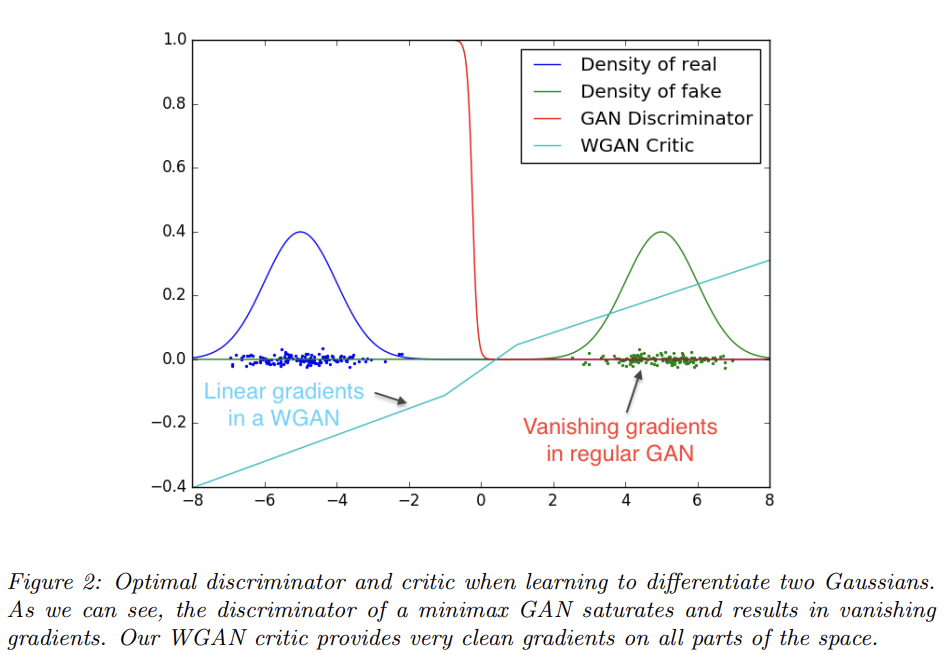

For more detailed information about Wasserstain GAN, you can check the following link. 
**_Source_** : [W-GAN Papers](https://arxiv.org/abs/1701.07875)

## State of The Art GANs.

<div style='text-align: justify;'> Througout the years, there were many attempts and research to create more advanced GAN architectures. However, in this project I only focus on a combinationa of StyleGAN Architecture and conditional GAN. Here are several other GAN architectures that might interest you:

1. **DCGAN**. Convolution layers for the Generator and Discriminator. Improving stability and scalability for image generation.
2. **CGAN**. Conditional GANs allow for conditioning the generation process on addtional information, such as class labels to genereate specific outputs.
3. **InfoGAN**. An extention of GANs that aims to learn interpretable and disentangled representations by maximizing mutual information betweeen subset latent variables and the generated samples.
4. **CycleGAN**. Introduced a cycle-consistency loss to enable unpaired image-to-image translation, such as turning photos into paintings and vice versa.
5. **BigGAN**. Scaled up GAN architecture with a large number of parameters, achieving state-of-the-art results in terms of image quality and diversity.
6. **StyleGAN**. A style-based generator achitecture for high-quality image syntesis, allowing for control over the style and content of generated images.
7. **StyleGAN 2**. An improved version of StyleGAN 2 with enhancement on image quality, stability, and the introduction of "Path length regularization" for better disentanglement of latent variables.
8. **BigGAN Deep**. An extention fo BigGAN with deeper architecture. </div>

## StyleGAN Architecture.

<center>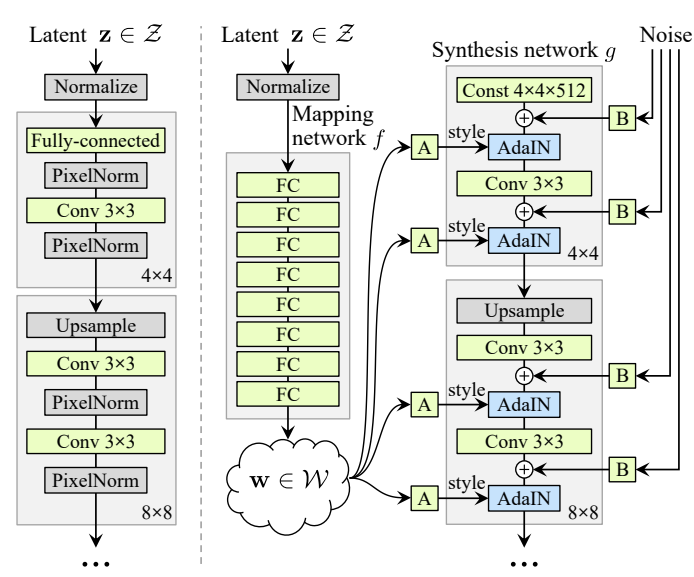</center>

<div style='text-align: justify;'>
In StyleGAN architecuture, the Generator achitecture is different than the original GAN. In the StyleGAN Generator, there is a new layer called Mapping Network that will map $z$ latent random variable into higher dimension of intermediate $w$ latent space. This layer will help to mitigate the disantanglement in $z$ latent random variable so that we can alter one of the feature of an image without changing other features. Additionaly, StyleGAN can generate high realistic images by adding Pixel Growing layer that will increase the dimension of the input vector gradually. For the detailed information about StyleGAN you can check the following link:

**_Source_**: [StyleGAN Paper](https://arxiv.org/abs/1812.04948)
</div>

## _STYLEGAN_ Code With Pytorch

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import torch.nn.functional as F

In [2]:
def show_tensor_images(image_tensor, num_images=16, size=(1, 64, 64), nrow=4):
    '''
    Function for visualizing images: Given a tensor of images, number of images,
    size per image, and images per row, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu().clamp_(0, 1)
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow, padding=0)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.axis('off')
    plt.show()

In [3]:
transform = transforms.Compose([
    transforms.Resize((64,64), interpolation=transforms.InterpolationMode.HAMMING),
    transforms.ToTensor(),
    transforms.GaussianBlur(kernel_size=5, sigma=3),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('-', download=True, transform=transform),
    batch_size=128,
    shuffle=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 252087064.77it/s]

Extracting -/MNIST/raw/train-images-idx3-ubyte.gz to -/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 39638643.27it/s]


Extracting -/MNIST/raw/train-labels-idx1-ubyte.gz to -/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 83406394.23it/s]

Extracting -/MNIST/raw/t10k-images-idx3-ubyte.gz to -/MNIST/raw




100%|██████████| 4542/4542 [00:00<00:00, 6270746.80it/s]


Extracting -/MNIST/raw/t10k-labels-idx1-ubyte.gz to -/MNIST/raw



In [4]:
for images, labels in dataloader:
    images_tensor = images[:16]
    labels_tensor = labels[:16]
    break

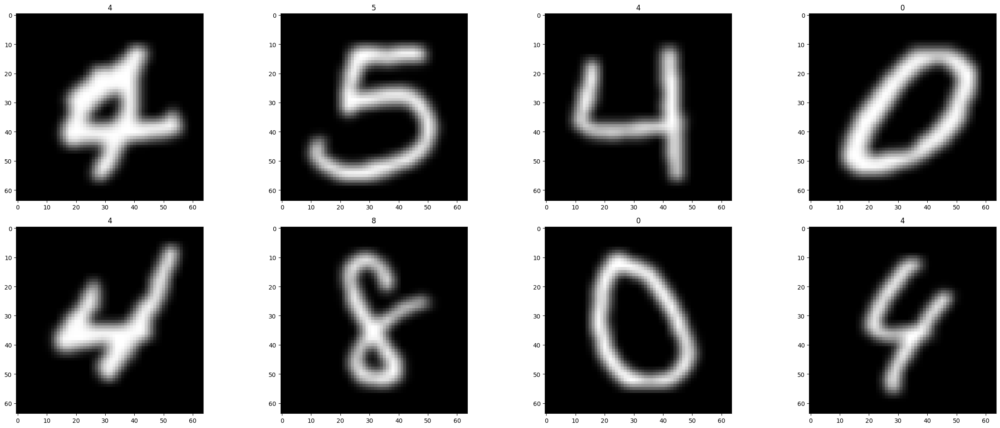

In [5]:
fig, axes = plt.subplots(2,4, figsize=(25,10))
for idx, ax in enumerate(axes.flat):
    image = images_tensor[idx].permute(1,2,0)
    label = labels_tensor[idx].numpy()
    ax.set_title(label)
    ax.imshow(image, cmap='gray')
plt.tight_layout()
plt.show()

In [4]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [8]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=16):

        super(Critic, self).__init__()
        self.block_1 = self.make_crit_block(im_chan, hidden_dim*8, kernel_size=3, padding=1)
        self.block_2 = self.make_crit_block(hidden_dim*8, hidden_dim*4, kernel_size=3, padding=1)
        self.block_3 = self.make_crit_block(hidden_dim*4, hidden_dim*2, kernel_size=3, padding=1)
        self.block_4 = self.make_crit_block(hidden_dim*2, hidden_dim, kernel_size=3, padding=1)
        self.final_block = self.make_crit_block(hidden_dim , 1, kernel_size=3, final_layer=True)

    def make_crit_block(self, input_channels, output_channels, kernel_size=2, padding = 0, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, padding=padding),
                nn.LeakyReLU(0.2, inplace=True),
                nn.Conv2d(output_channels, output_channels, kernel_size, padding=padding),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride=2),

            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor,
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        x = self.block_1(image)
        x = F.interpolate(x, size=(32,32), mode='bilinear')
        x = self.block_2(x)
        x = F.interpolate(x, size=(16,16), mode='bilinear')
        x = self.block_3(x)
        x = F.interpolate(x, size=(8,8), mode='bilinear')
        x = self.block_4(x)
        x = F.interpolate(x, size=(4,4), mode='bilinear')
        crit_pred = self.final_block(x)
        return crit_pred.view(len(x), -1)

In [10]:
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)
    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    # Penalize the mean squared distance of the gradient norms from 1
    penalty = torch.mean(torch.pow(gradient_norm - 1, 2))
    return penalty

In [11]:
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = torch.mean(torch.zeros_like(crit_fake_pred)-crit_fake_pred)
    return gen_loss

def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    crit_loss = torch.mean(crit_fake_pred-crit_real_pred + c_lambda*gp)
    return crit_loss

In [12]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector.
        In this assignment, this will be the noise vector of shape (n_samples, z_dim),
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    combined = torch.cat((x.float(),y.float()), dim=1)
    return combined

In [13]:
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns:
        generator_input_dim: the input dimensionality of the conditional generator,
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0]+n_classes
    return generator_input_dim, discriminator_im_chan

In [14]:
def get_truncated_noise(n_samples, z_dim, truncation):
    '''
    Function for creating truncated noise vectors: Given the dimensions (n_samples, z_dim)
    and truncation value, creates a tensor of that shape filled with random
    numbers from the truncated normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        truncation: the truncation value, a non-negative scalar
    '''

    truncated_noise = truncnorm.rvs(-truncation, truncation, size=(n_samples, z_dim))
    return torch.Tensor(truncated_noise)

In [16]:
class MappingLayers(nn.Module):
    '''
    Mapping Layers Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        hidden_dim: the inner dimension, a scalar
        w_dim: the dimension of the intermediate noise vector, a scalar
    '''

    def __init__(self, z_dim, hidden_dim, w_dim):
        super().__init__()
        self.mapping = nn.Sequential(
            # Please write a neural network which takes in tensors of
            # shape (n_samples, z_dim) and outputs (n_samples, w_dim)
            # with a hidden layer with hidden_dim neurons
            #### START CODE HERE ####
            nn.Linear(z_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, w_dim),
            # nn.ReLU(inplace=True),
            # nn.Linear(hidden_dim, hidden_dim),
            # nn.ReLU(inplace=True),
            # nn.Linear(hidden_dim, hidden_dim),
            # nn.ReLU(inplace=True),
            # nn.Linear(hidden_dim, hidden_dim),
            # nn.ReLU(inplace=True),
            # nn.Linear(hidden_dim, w_dim),
            # nn.Relu(inplace=True),
            #### END CODE HERE ####
        )

    def forward(self, noise):
        '''
        Function for completing a forward pass of MappingLayers:
        Given an initial noise tensor, returns the intermediate noise tensor.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.mapping(noise)

    #UNIT TEST COMMENT: Required for grading
    def get_mapping(self):
        return self.mapping


class InjectNoise(nn.Module):
    '''
    Inject Noise Class
    Values:
        channels: the number of channels the image has, a scalar
    '''
    def __init__(self, channels):
        super().__init__()
        self.weight = nn.Parameter(
            torch.randn(size=(1,channels, 1, 1))
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of InjectNoise: Given an image,
        returns the image with random noise added.
        Parameters:
            image: the feature map of shape (n_samples, channels, width, height)
        '''
        noise_shape = (image.size(0), 1, image.size(2), image.size(3))

        noise = torch.randn(size=noise_shape, device=image.device) # Creates the random noise

        return image + self.weight * noise # Applies to image after multiplying by the weight for each channel

class AdaIN(nn.Module):
    '''
    AdaIN Class
    Values:
        channels: the number of channels the image has, a scalar
        w_dim: the dimension of the intermediate noise vector, a scalar
    '''

    def __init__(self, channels, w_dim):
        super().__init__()

        # Normalize the input per-dimension
        self.instance_norm = nn.InstanceNorm2d(channels)

        self.style_scale_transform = nn.Linear(w_dim, channels)
        self.style_shift_transform = nn.Linear(w_dim, channels)

    def forward(self, image, w):
        '''
        Function for completing a forward pass of AdaIN: Given an image and intermediate noise vector w,
        returns the normalized image that has been scaled and shifted by the style.
        Parameters:
            image: the feature map of shape (n_samples, channels, width, height)
            w: the intermediate noise vector
        '''
        normalized_image = self.instance_norm(image)
        style_scale = self.style_scale_transform(w)[:, :, None, None]
        style_shift = self.style_shift_transform(w)[:, :, None, None]

        transformed_image = style_scale*normalized_image + style_shift
        return transformed_image

In [17]:
class MicroStyleGANGeneratorBlock(nn.Module):
    '''
    Micro StyleGAN Generator Block Class
    Values:
        in_chan: the number of channels in the input, a scalar
        out_chan: the number of channels wanted in the output, a scalar
        w_dim: the dimension of the intermediate noise vector, a scalar
        kernel_size: the size of the convolving kernel
        starting_size: the size of the starting image
    '''

    def __init__(self, in_chan, out_chan, w_dim, kernel_size, starting_size, use_upsample=True):
        super().__init__()
        self.use_upsample = use_upsample
        if self.use_upsample:
            self.upsample = nn.Upsample((starting_size, starting_size), mode='bilinear')
        self.conv = nn.Conv2d(in_chan, out_chan, kernel_size, padding=1) # Padding is used to maintain the image size
        self.inject_noise = InjectNoise(out_chan)
        self.adain = AdaIN(out_chan, w_dim)
        self.activation = nn.LeakyReLU(negative_slope=0.2)

    def forward(self, x, w):
        '''
        Function for completing a forward pass of MicroStyleGANGeneratorBlock: Given an x and w,
        computes a StyleGAN generator block.
        Parameters:
            x: the input into the generator, feature map of shape (n_samples, channels, width, height)
            w: the intermediate noise vector
        '''
        if self.use_upsample:
            x = self.upsample(x)
        x = self.conv(x)
        x = self.inject_noise(x)
        x = self.adain(x, w)
        x = self.activation(x)
        return x

class MicroStyleGANGenerator(nn.Module):
    '''
    Micro StyleGAN Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        map_hidden_dim: the mapping inner dimension, a scalar
        w_dim: the dimension of the intermediate noise vector, a scalar
        in_chan: the dimension of the constant input, usually w_dim, a scalar
        out_chan: the number of channels wanted in the output, a scalar
        kernel_size: the size of the convolving kernel
        hidden_chan: the inner dimension, a scalar
    '''

    def __init__(self,
                 z_dim,
                 map_hidden_dim,
                 w_dim,
                 in_chan,
                 out_chan,
                 kernel_size,
                 hidden_chan):
        super().__init__()
        self.map = MappingLayers(z_dim, map_hidden_dim, w_dim)
        # Typically this constant is initiated to all ones, but you will initiate to a
        # Gaussian to better visualize the network's effect
        self.starting_constant = nn.Parameter(torch.randn(1, in_chan, 4, 4))
        self.block0 = MicroStyleGANGeneratorBlock(in_chan, hidden_chan, w_dim, kernel_size, 4, use_upsample=False)
        self.block1 = MicroStyleGANGeneratorBlock(hidden_chan, hidden_chan, w_dim, kernel_size, 8)
        self.block2 = MicroStyleGANGeneratorBlock(hidden_chan, hidden_chan, w_dim, kernel_size, 16)
        self.block3 = MicroStyleGANGeneratorBlock(hidden_chan, hidden_chan, w_dim, kernel_size, 32)
        self.block4 = MicroStyleGANGeneratorBlock(hidden_chan, hidden_chan, w_dim, kernel_size, 64)
        # You need to have a way of mapping from the output noise to an image,
        # so you learn a 1x1 convolution to transform the e.g. 512 channels into 3 channels
        # (Note that this is simplified, with clipping used in the real StyleGAN)
        self.block1_to_image = nn.Conv2d(hidden_chan, out_chan, kernel_size=1)
        self.block2_to_image = nn.Conv2d(hidden_chan, out_chan, kernel_size=1)
        self.block3_to_image = nn.Conv2d(hidden_chan, out_chan, kernel_size=1)
        self.block4_to_image = nn.Conv2d(hidden_chan, out_chan, kernel_size=1)
        self.alpha = 0.2

    def upsample_to_match_size(self, smaller_image, bigger_image):
        '''
        Function for upsampling an image to the size of another: Given a two images (smaller and bigger),
        upsamples the first to have the same dimensions as the second.
        Parameters:
            smaller_image: the smaller image to upsample
            bigger_image: the bigger image whose dimensions will be upsampled to
        '''
        return F.interpolate(smaller_image, size=bigger_image.shape[-2:], mode='bilinear')

    def forward(self, noise, return_intermediate=False):
        '''
        Function for completing a forward pass of MicroStyleGANGenerator: Given noise,
        computes a StyleGAN iteration.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
            return_intermediate: a boolean, true to return the images as well (for testing) and false otherwise
        '''
        x = self.starting_constant
        w = self.map(noise)
        x = self.block0(x, w)
        x_b1 = self.block1(x, w) # First generator run output
        x_b1_image = self.block1_to_image(x_b1)
        x_b2 = self.block2(x_b1, w) # Second generator run output
        x_b2_image = self.block2_to_image(x_b2)
        x_b1_upsample = self.upsample_to_match_size(x_b1_image, x_b2_image) # Upsample first generator run output to be same size as second generator run output
        x_b1_upsample_raw = self.upsample_to_match_size(x_b1, x_b2)
        interpolation_b1_b2 = (1-self.alpha)*x_b1_upsample_raw + (self.alpha)*x_b2

        x_b3 = self.block3(interpolation_b1_b2, w) # Third Generator run output
        x_b3_image = self.block3_to_image(x_b3)
        x_b4 = self.block4(x_b3, w) # Fourth generator run output
        x_b4_image = self.block4_to_image(x_b4)
        x_b3_upsample = self.upsample_to_match_size(x_b3_image, x_b4_image) # Upsample third generator run output to be same size as second generator run output
        interpolation_b3_b4 = (1-self.alpha)*x_b3_upsample + (self.alpha)*x_b4_image
        if return_intermediate:
            return interpolation_b3_b4, x_b3_upsample, x_b4_image
        return interpolation_b3_b4

In [18]:
n_epochs = 100
z_dim = 128
display_step = 500
batch_size = 128
out_chan = 1
truncation = 1
lr = 0.0001
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10 ## 10
crit_repeats = 5
device = 'cuda' if torch.cuda.is_available() else 'cpu'
n_classes = 10

In [19]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, (1,64,64) , n_classes)

In [20]:
gen = MicroStyleGANGenerator(z_dim=generator_input_dim, map_hidden_dim=256, w_dim=496, in_chan=512, out_chan=out_chan, kernel_size=3, hidden_chan=256).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic(discriminator_im_chan).to(device)
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

gen = gen.apply(weights_init)
crit = crit.apply(weights_init)
gen.alpha = 0.5

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1, step 500: Generator loss: 160.83241756736487, critic loss: -7.95506513503492


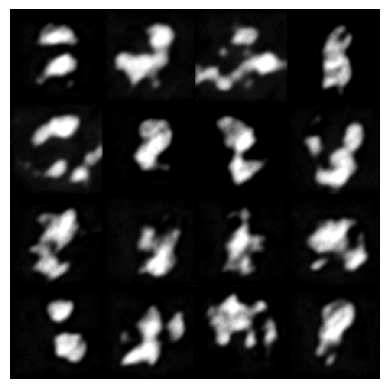

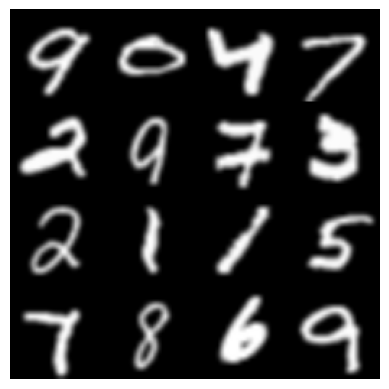

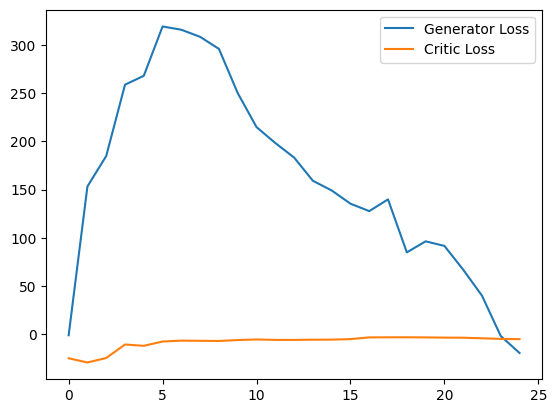

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: -5.653202363461256, critic loss: -4.648362743389606


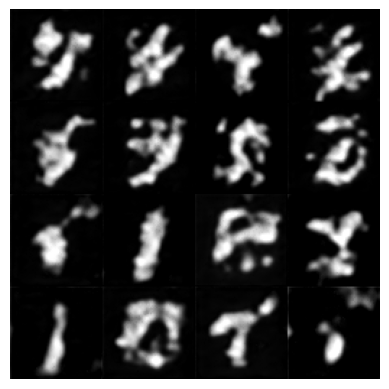

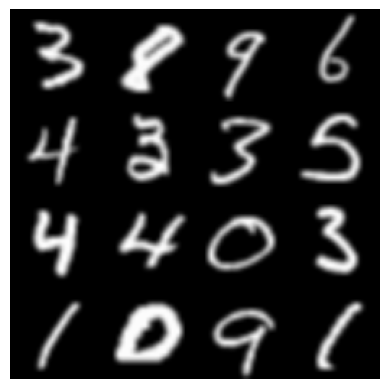

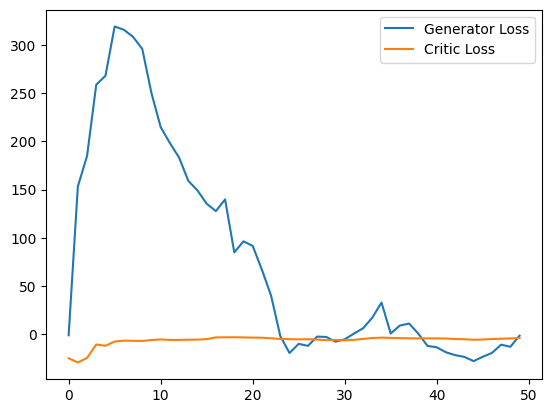

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3, step 1500: Generator loss: 25.90501027518511, critic loss: -4.059799251151084


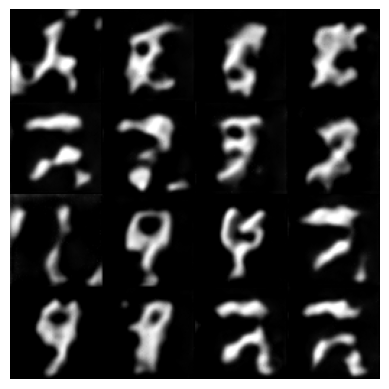

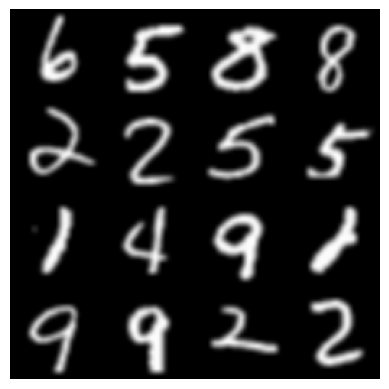

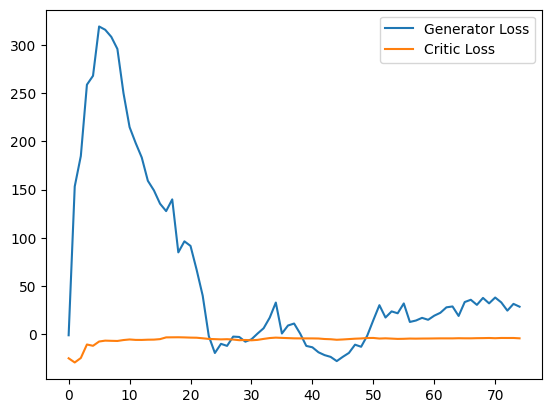

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 75.62512094730138, critic loss: -4.035770317506792


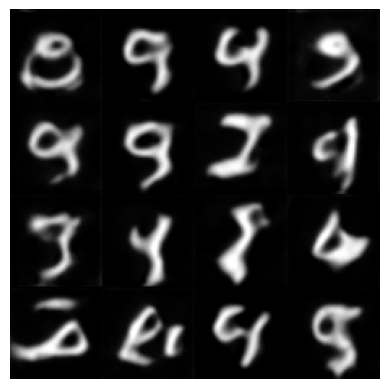

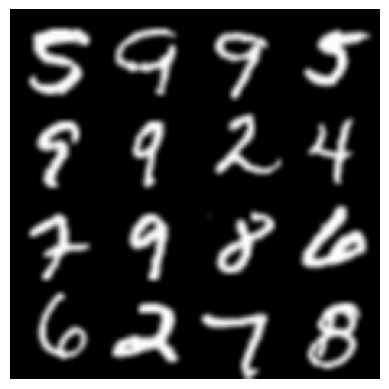

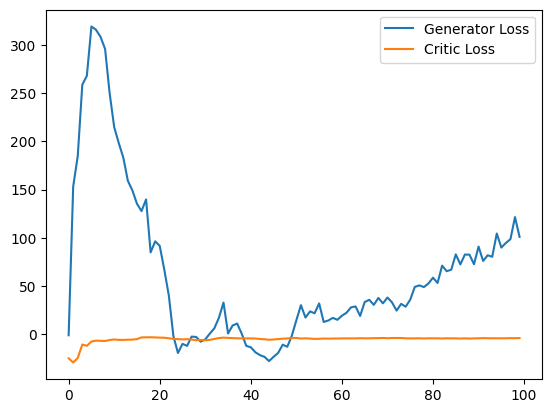

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5, step 2500: Generator loss: 115.09754182815551, critic loss: -3.6014703087866335


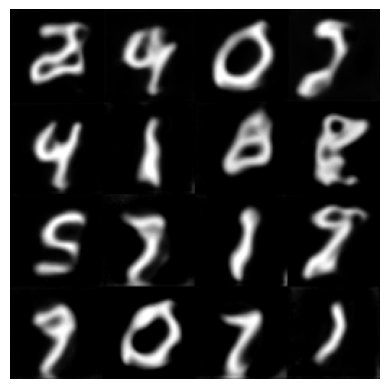

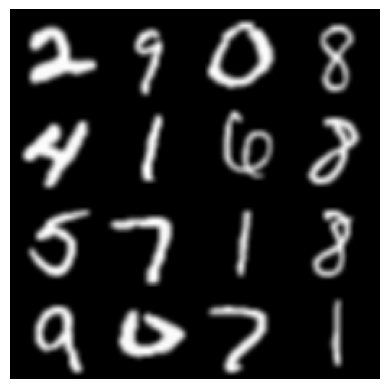

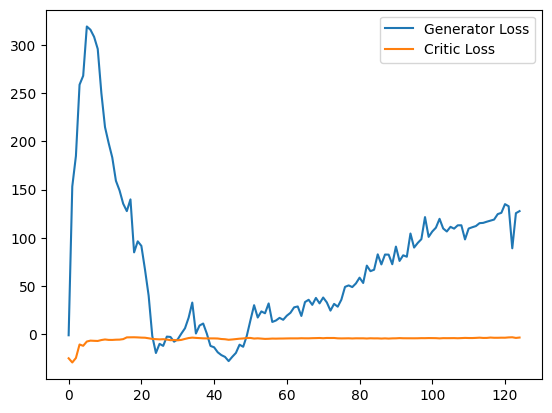

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 133.95098756408692, critic loss: -2.994598056077956


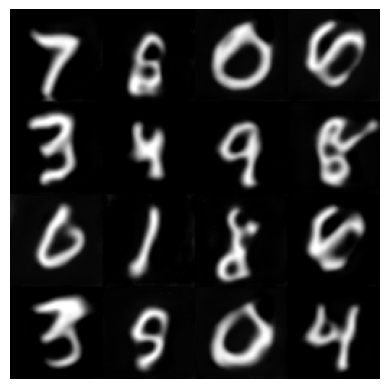

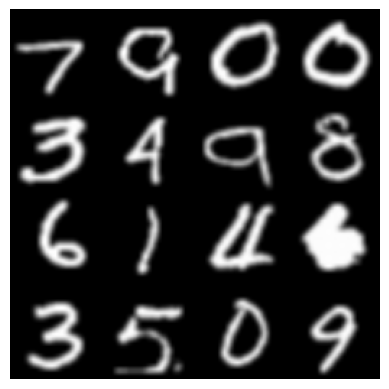

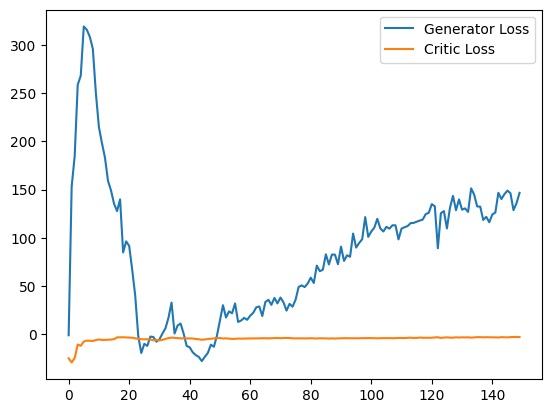

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7, step 3500: Generator loss: 156.66422486877443, critic loss: -2.8541231060177097


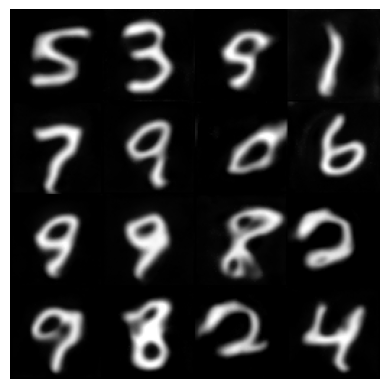

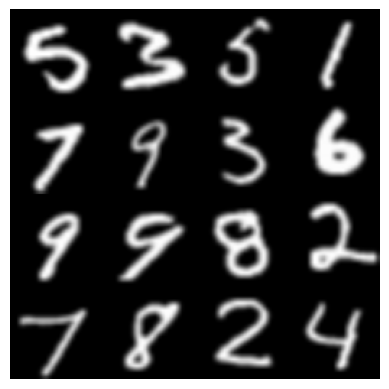

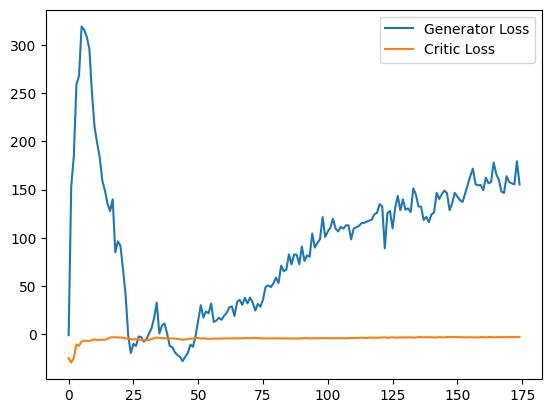

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 4000: Generator loss: 163.21798880004883, critic loss: -2.6719525929808605


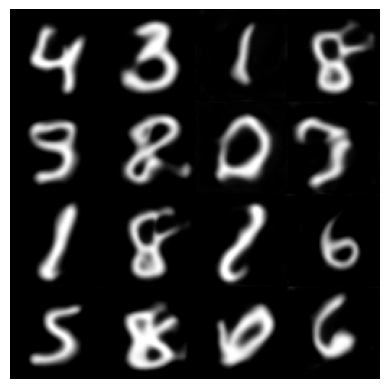

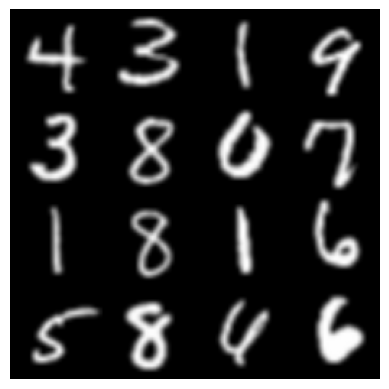

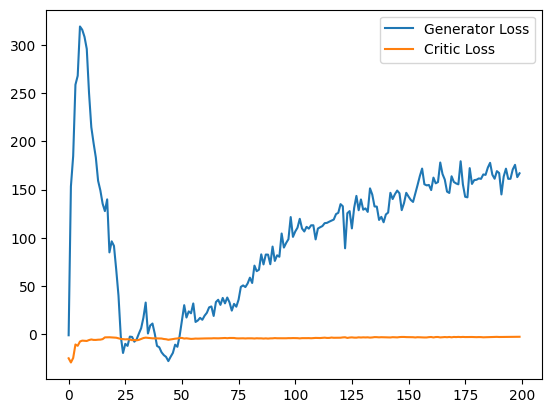

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9, step 4500: Generator loss: 149.44405015563964, critic loss: -2.174059610509872


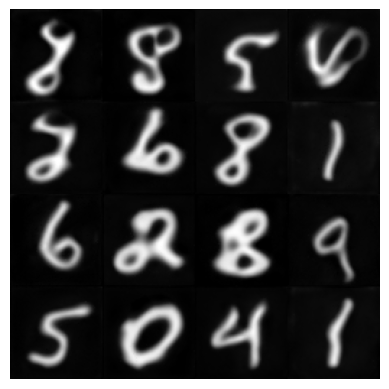

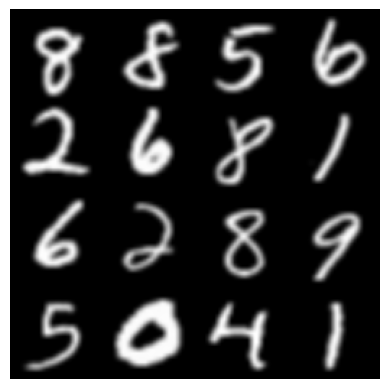

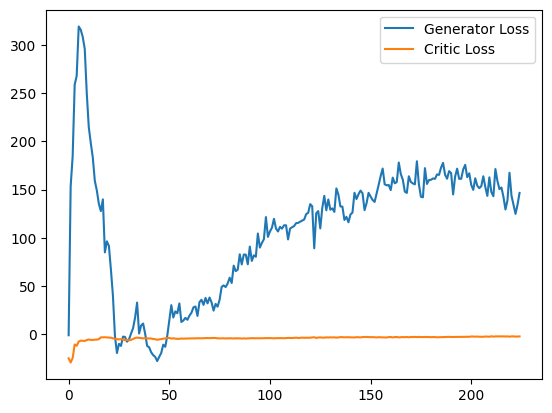

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 5000: Generator loss: 141.95278115844727, critic loss: -2.1718774206101896


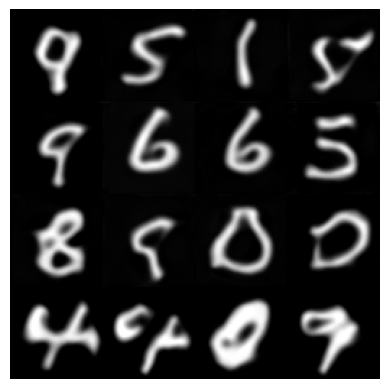

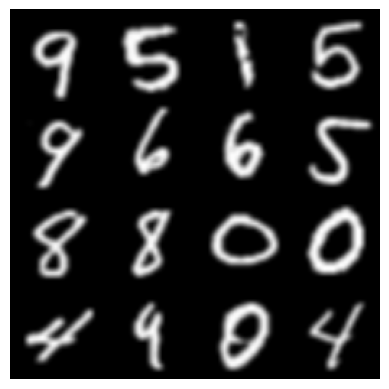

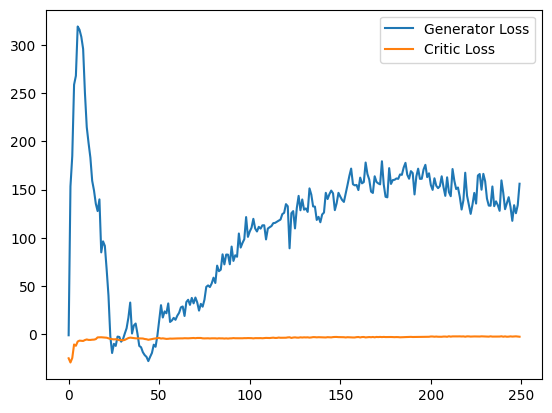

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11, step 5500: Generator loss: 138.58484379577638, critic loss: -2.223996219083667


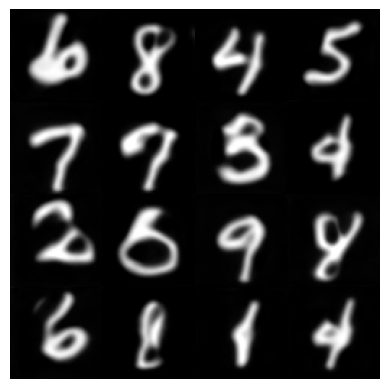

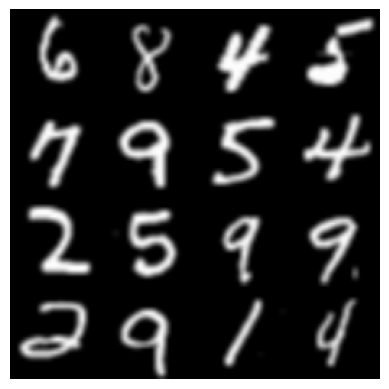

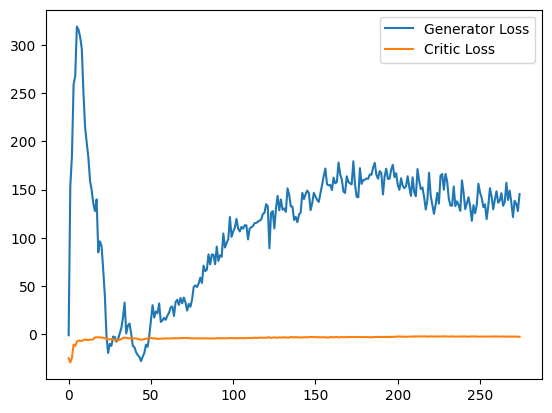

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 6000: Generator loss: 144.32703671264647, critic loss: -2.168439419445396


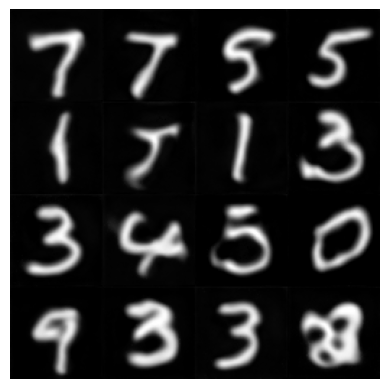

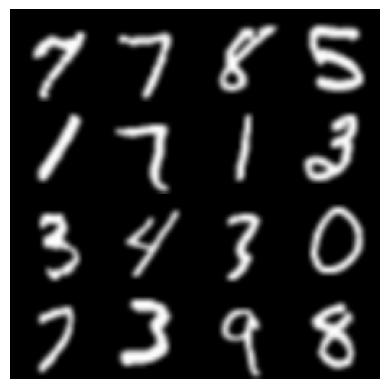

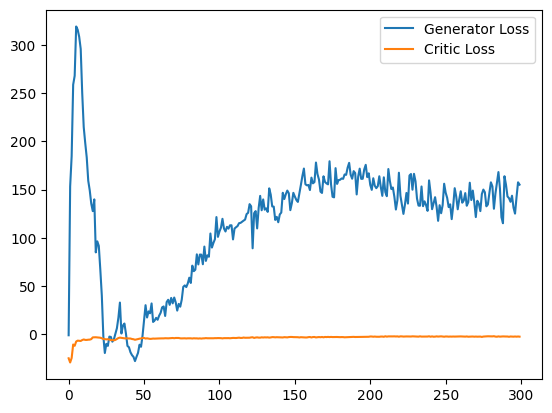

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13, step 6500: Generator loss: 150.118605758667, critic loss: -2.2425074526309965


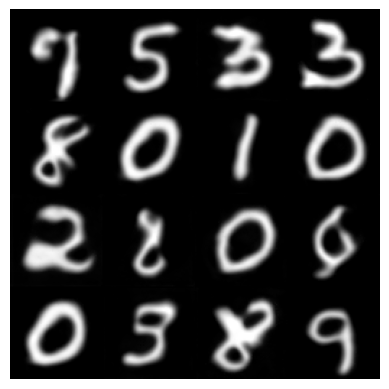

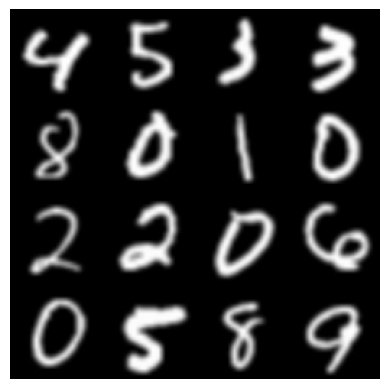

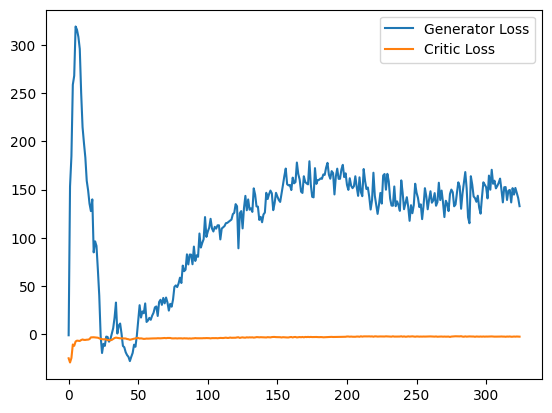

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 7000: Generator loss: 146.23209956359864, critic loss: -2.3168860872596495


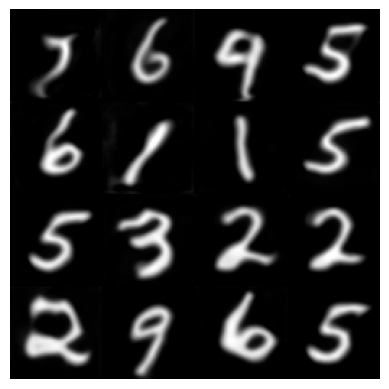

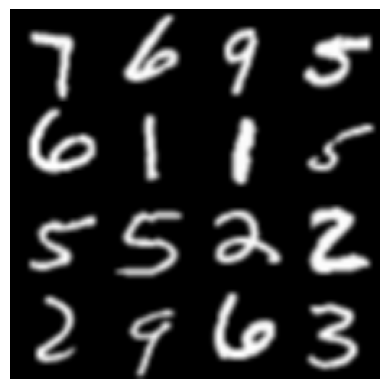

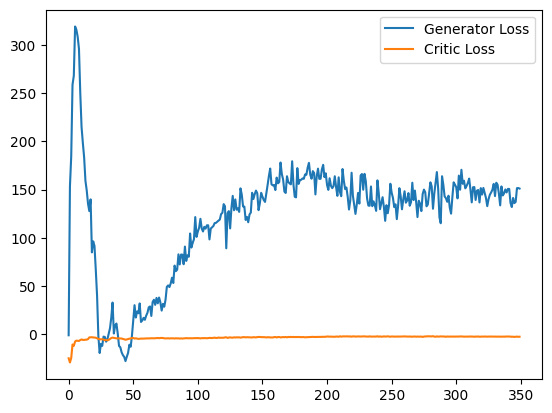

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15, step 7500: Generator loss: 138.49547094726563, critic loss: -2.1253035836309206


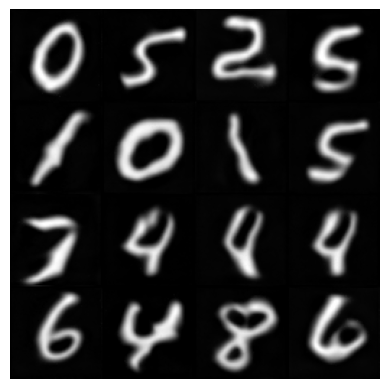

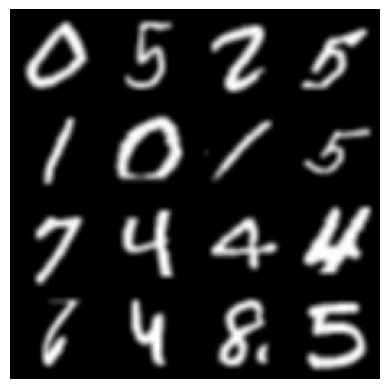

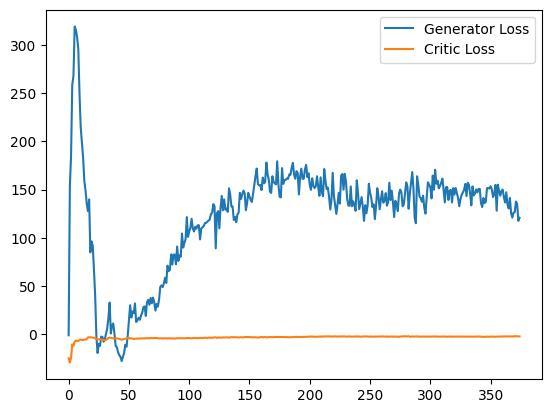

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 128.8707240600586, critic loss: -1.9520396142482757


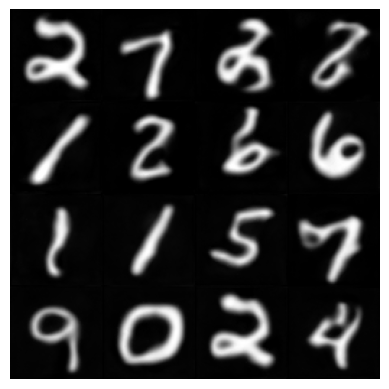

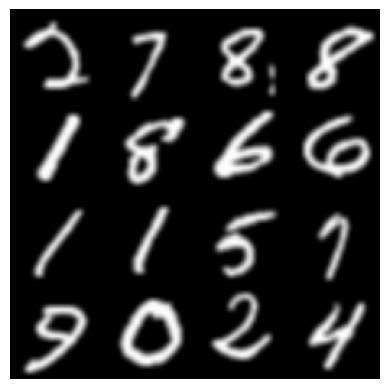

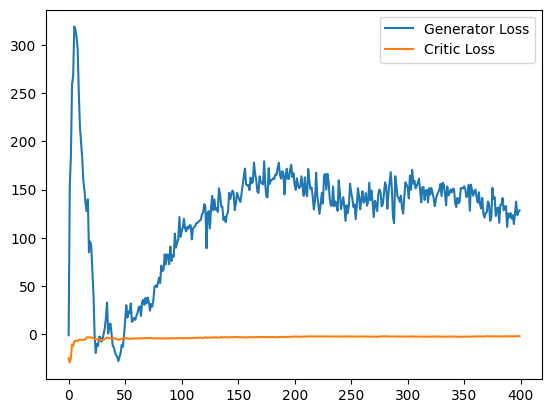

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18, step 8500: Generator loss: 122.02018388366699, critic loss: -2.0026581427961587


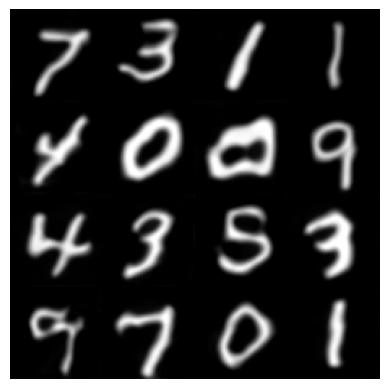

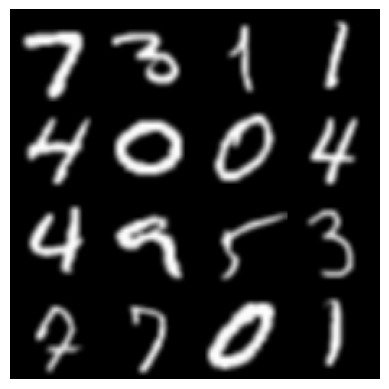

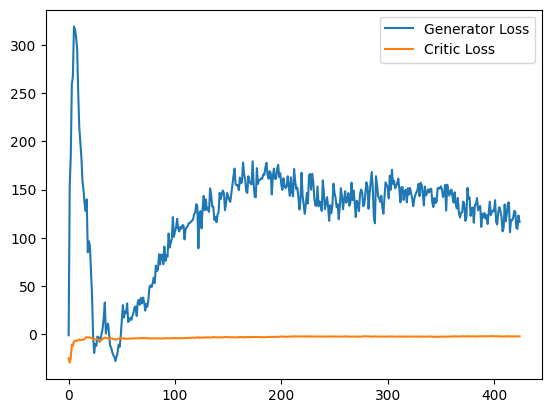

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 123.20857449340821, critic loss: -1.9717502609103903


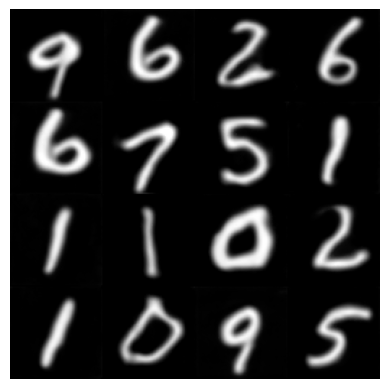

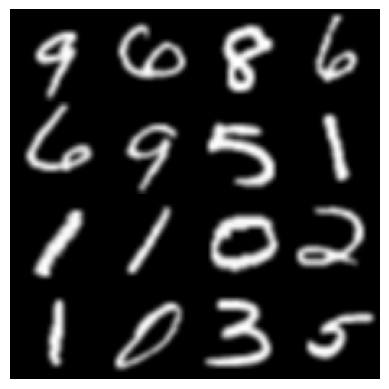

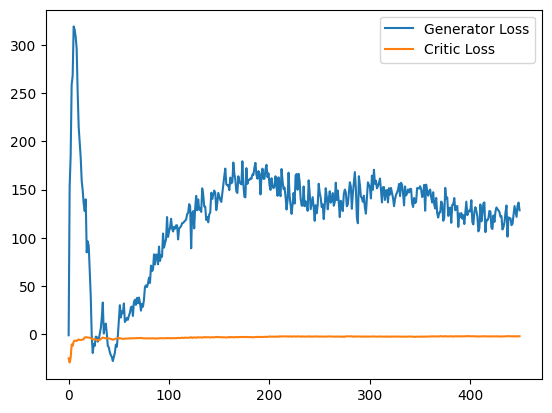

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20, step 9500: Generator loss: 116.86142622375488, critic loss: -1.8828496810019018


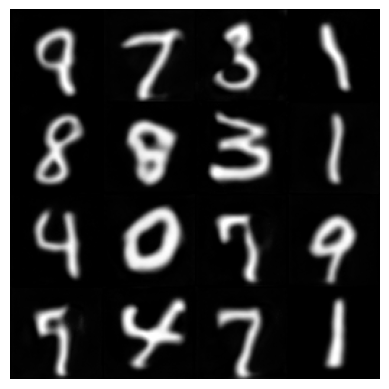

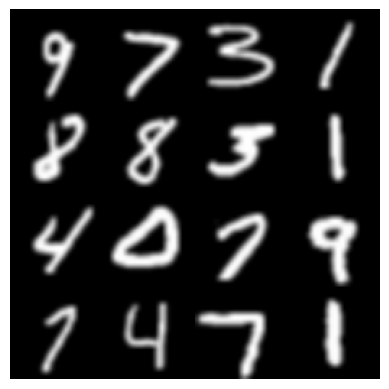

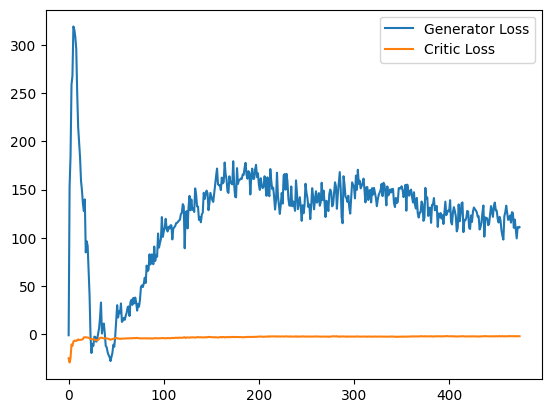

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 119.21501248168946, critic loss: -1.8351291820995506


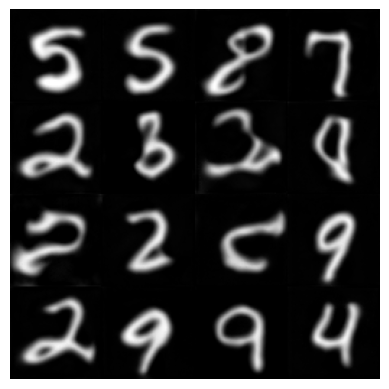

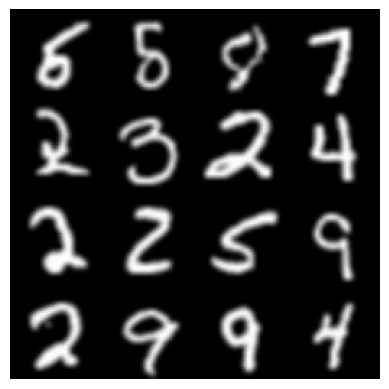

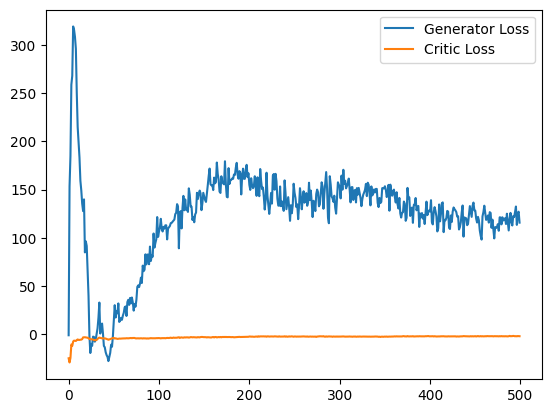

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22, step 10500: Generator loss: 114.11139405059815, critic loss: -1.637014344526828


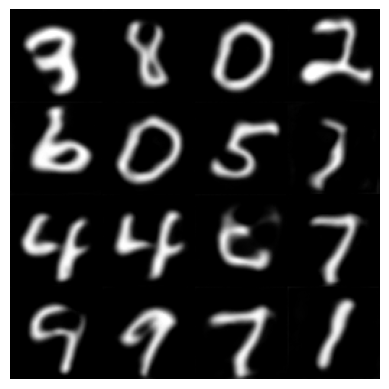

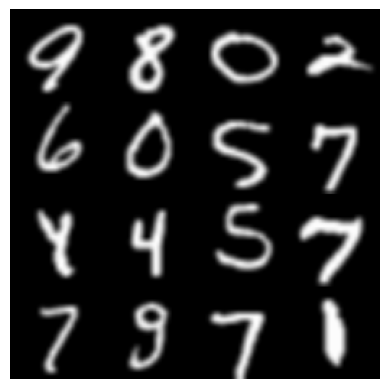

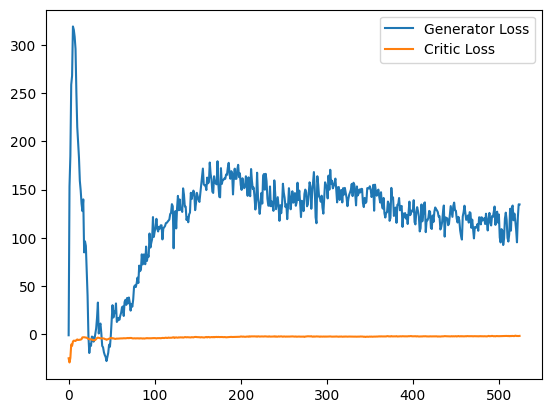

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 11000: Generator loss: 113.61223310852051, critic loss: -1.6978322648078217


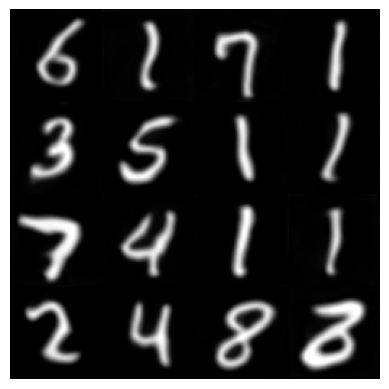

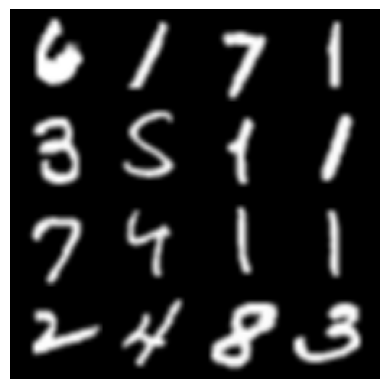

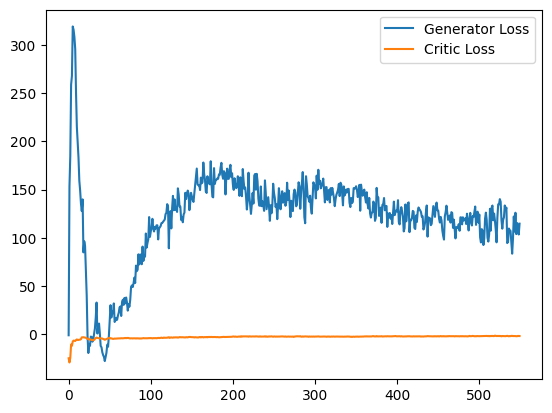

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24, step 11500: Generator loss: 105.53399464416503, critic loss: -1.679560800500215


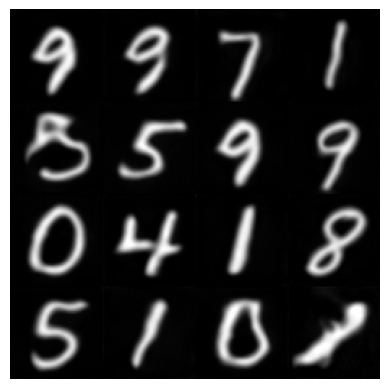

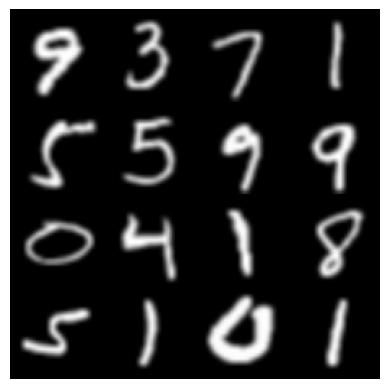

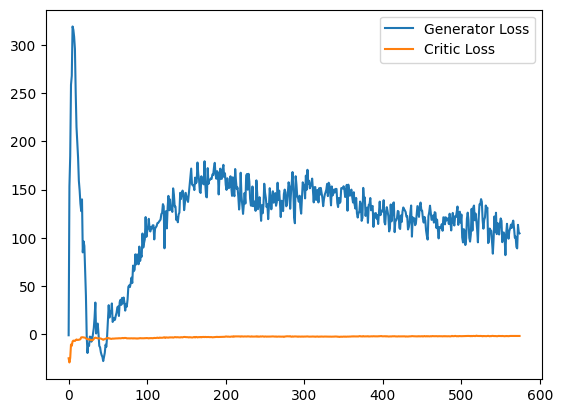

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 12000: Generator loss: 105.56560026550292, critic loss: -1.6188265919312832


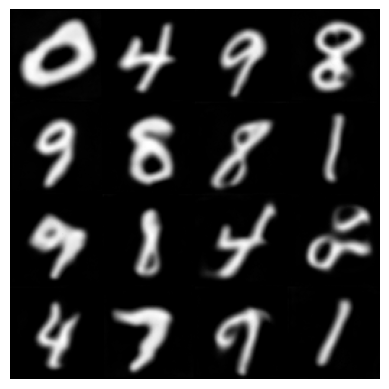

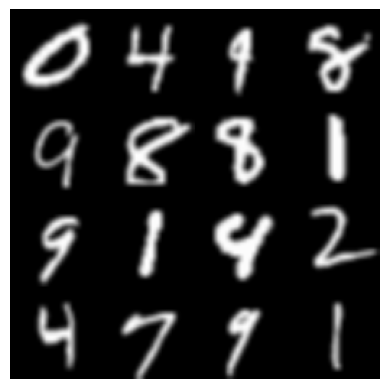

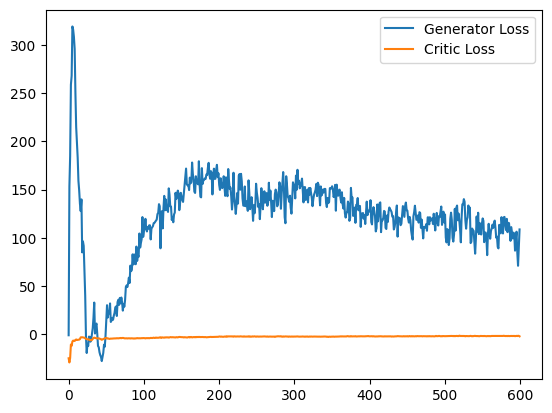

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26, step 12500: Generator loss: 104.48867642974854, critic loss: -1.5519663907110692


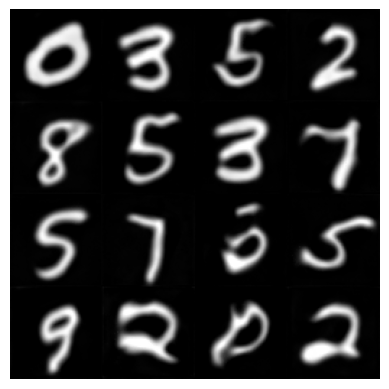

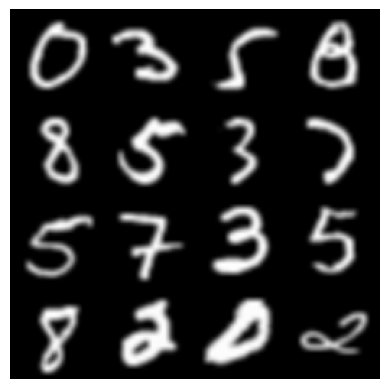

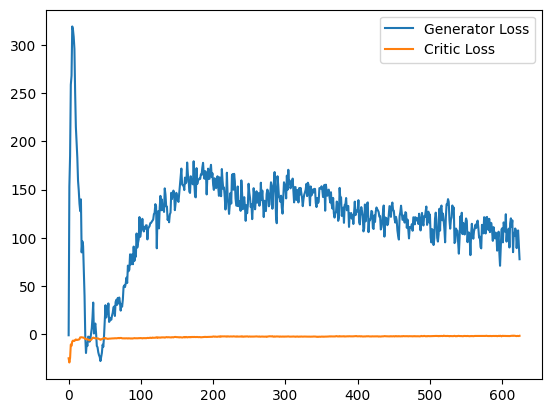

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 13000: Generator loss: 99.96339643859864, critic loss: -1.563996265256405


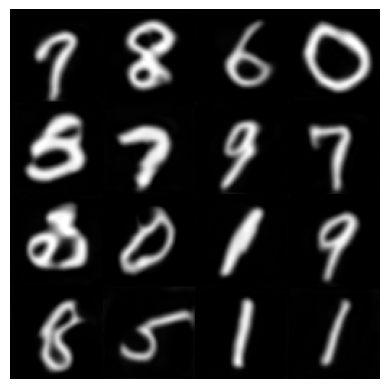

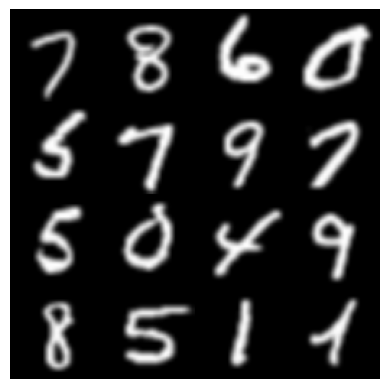

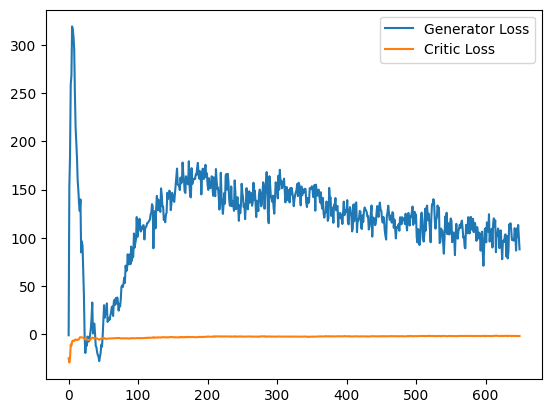

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28, step 13500: Generator loss: 92.97814639282227, critic loss: -1.63592585285604


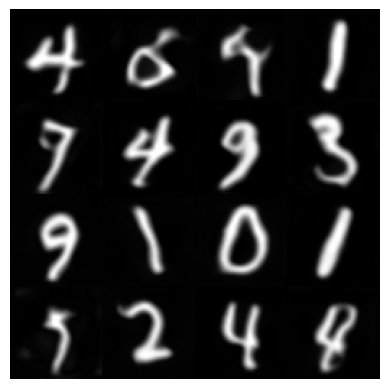

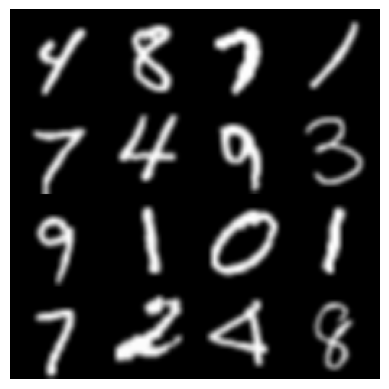

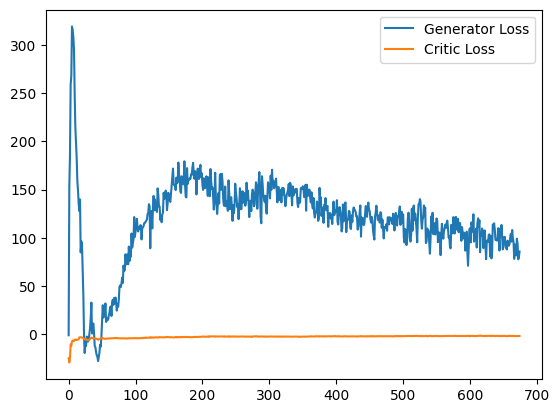

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 14000: Generator loss: 92.8038711013794, critic loss: -1.6277833991512676


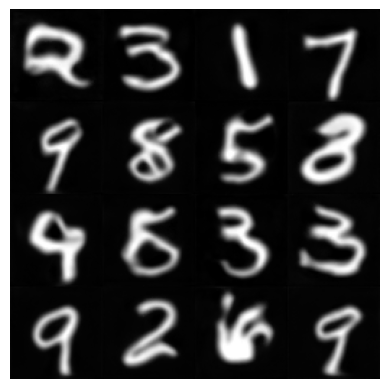

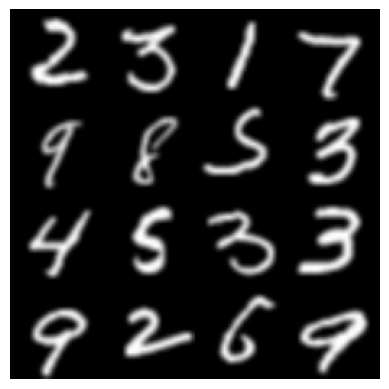

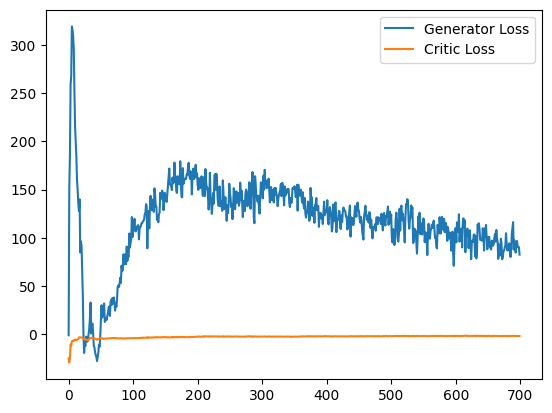

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30, step 14500: Generator loss: 87.57739855957031, critic loss: -1.6034820910364382


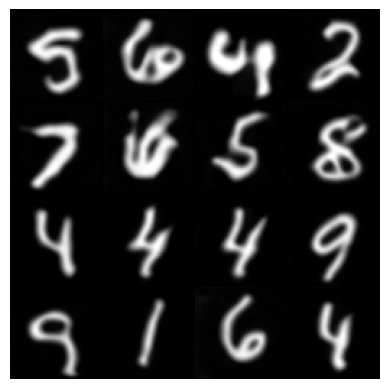

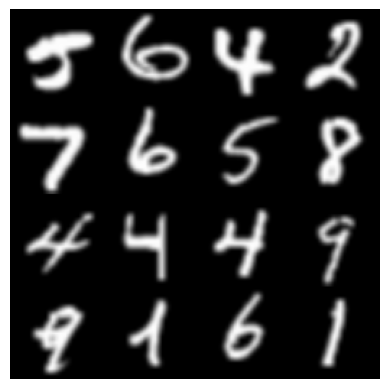

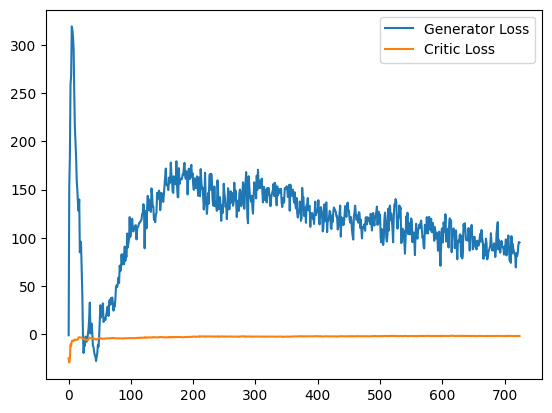

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 15000: Generator loss: 90.52342308044433, critic loss: -1.6335604257494214


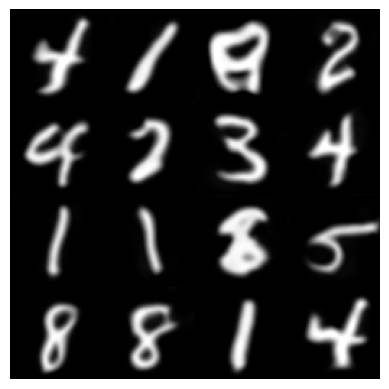

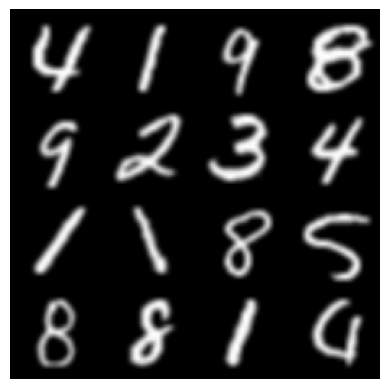

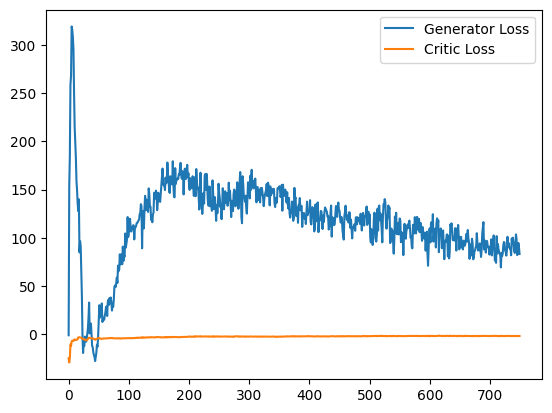

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33, step 15500: Generator loss: 89.94659731292725, critic loss: -1.5567520562395452


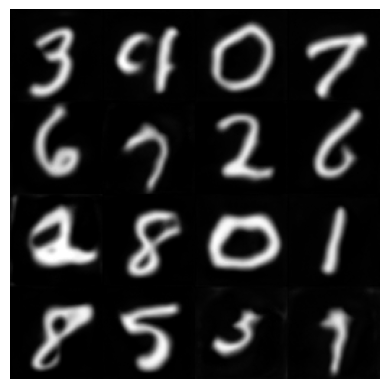

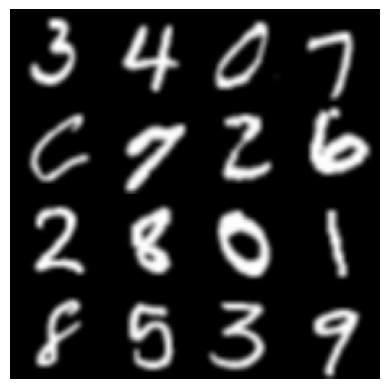

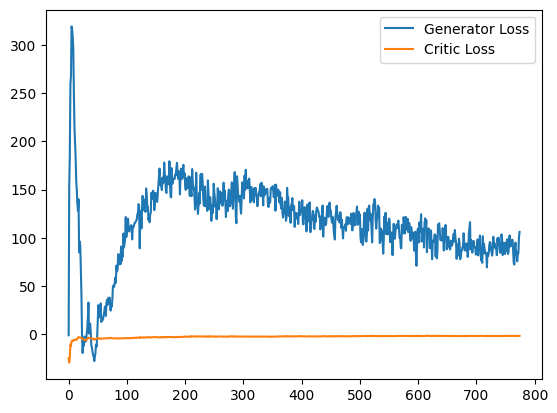

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 92.7798176574707, critic loss: -1.5207999281942843


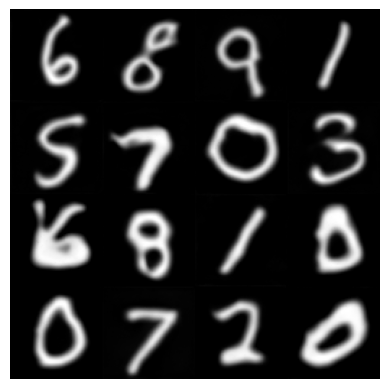

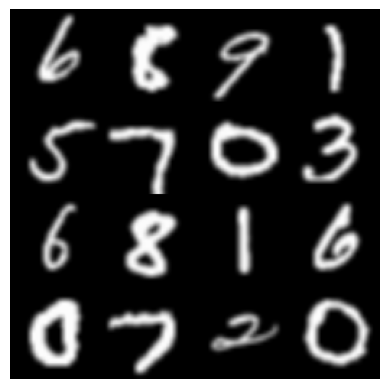

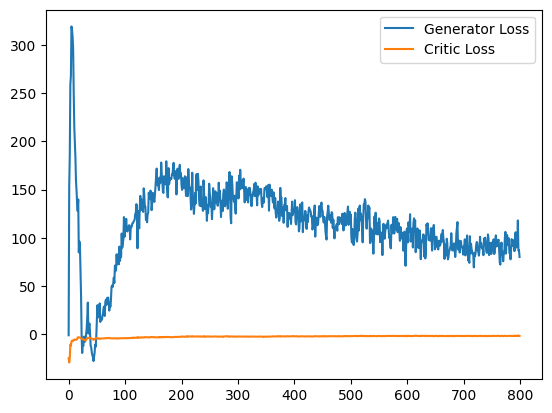

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35, step 16500: Generator loss: 86.92116219329834, critic loss: -1.4918164256781352


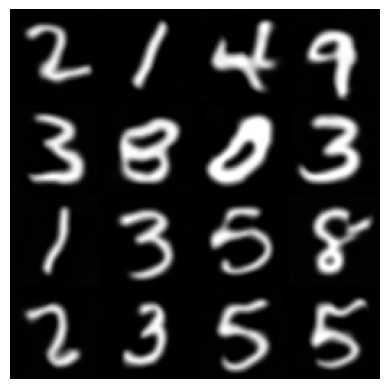

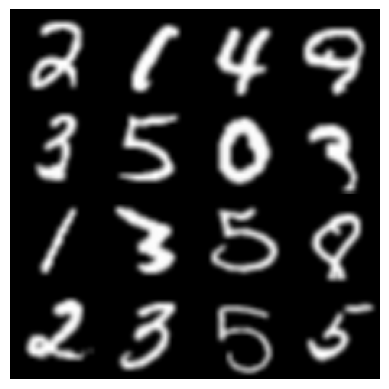

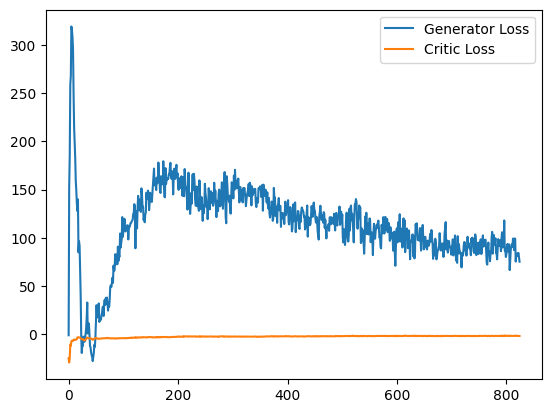

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 82.57107167053222, critic loss: -1.4487454423755426


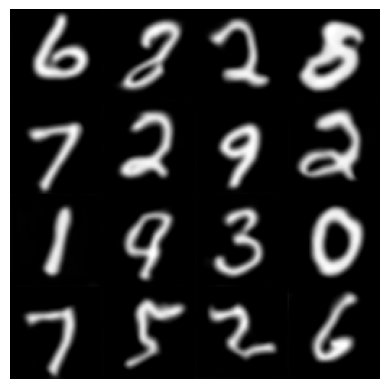

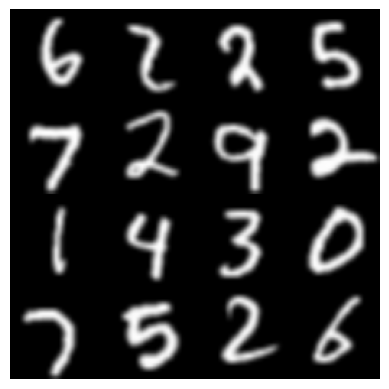

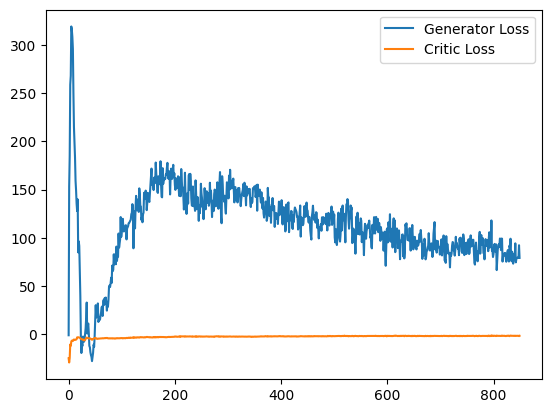

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37, step 17500: Generator loss: 83.42408425903321, critic loss: -1.4143914647012938


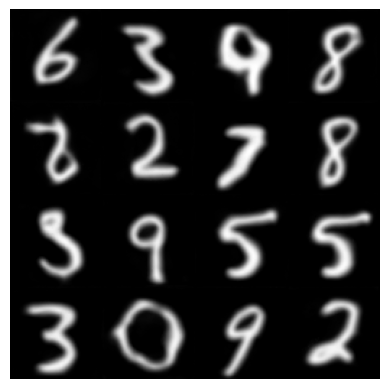

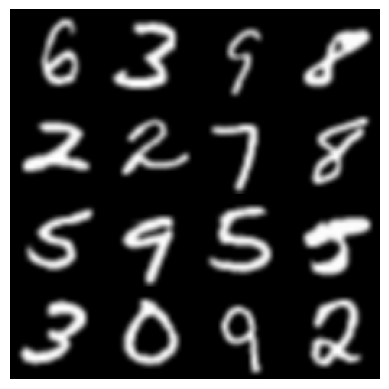

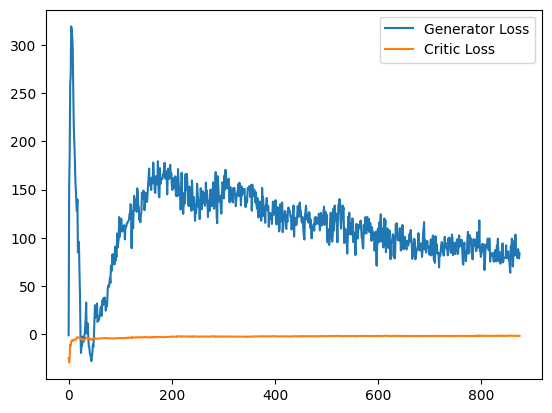

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 79.44065604400635, critic loss: -1.4112300749748952


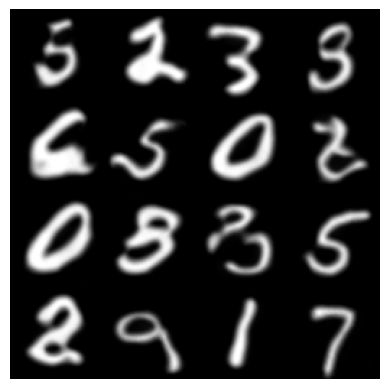

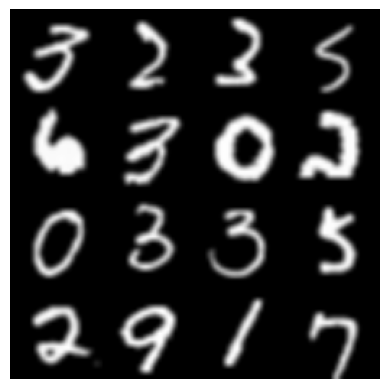

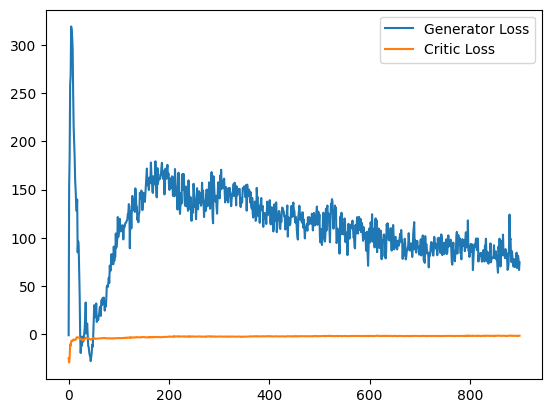

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39, step 18500: Generator loss: 75.21848561096192, critic loss: -1.4501160611957327


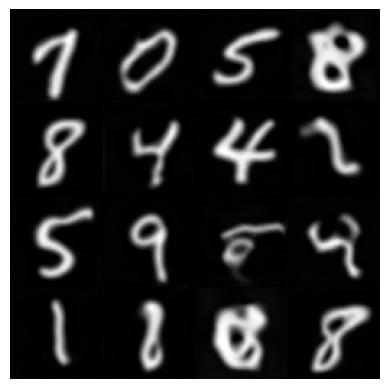

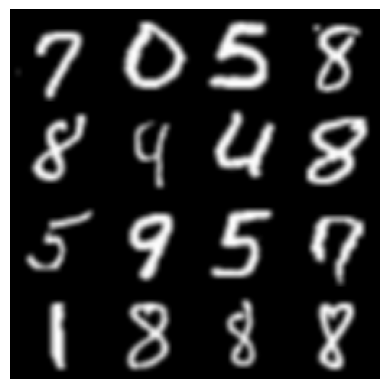

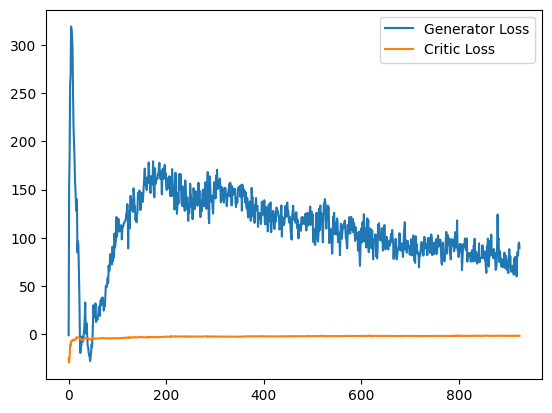

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 19000: Generator loss: 77.29902732086181, critic loss: -1.447691953276098


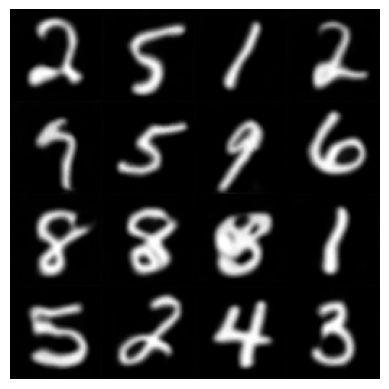

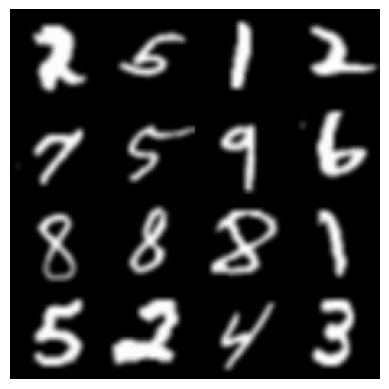

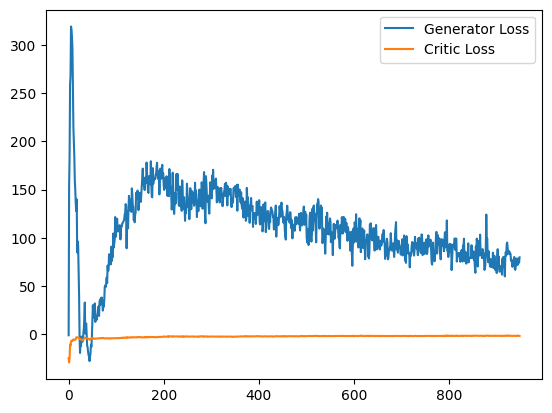

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41, step 19500: Generator loss: 77.09206354522705, critic loss: -1.432965300032496


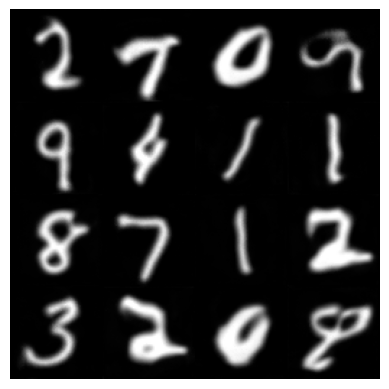

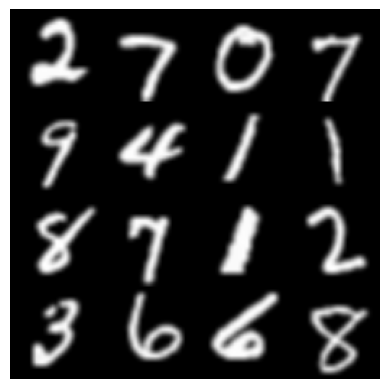

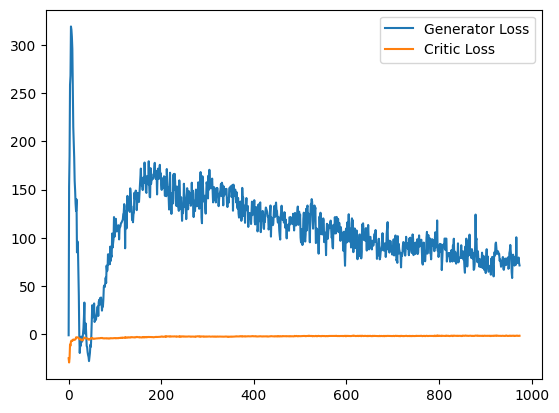

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 20000: Generator loss: 71.28760160064698, critic loss: -1.4272208966135966


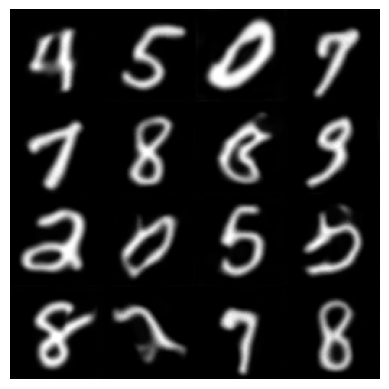

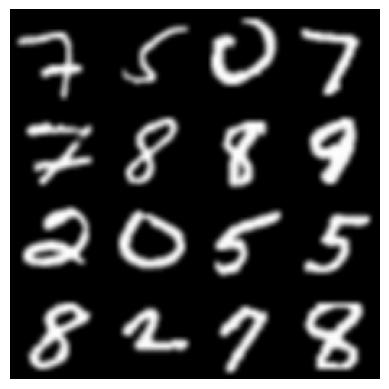

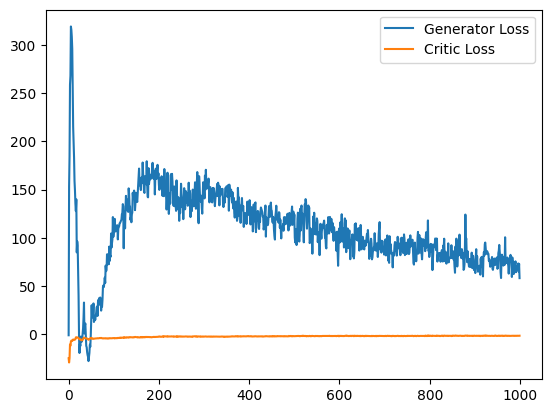

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43, step 20500: Generator loss: 71.02525582122803, critic loss: -1.3767604473426949


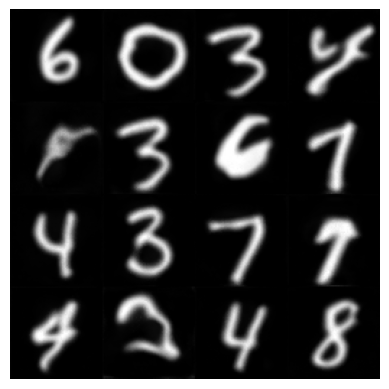

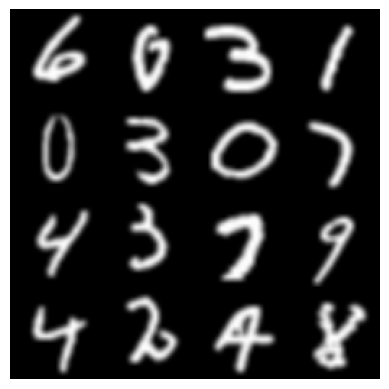

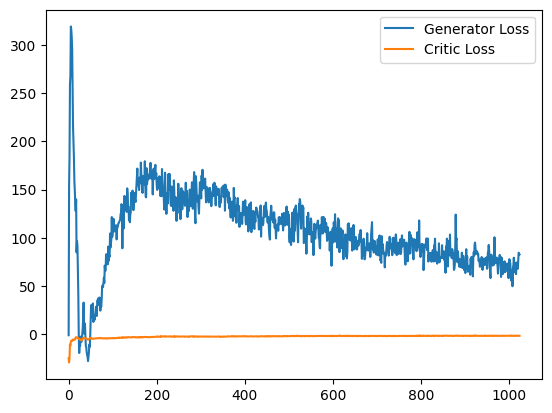

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 21000: Generator loss: 65.67466404724121, critic loss: -1.3980898629561058


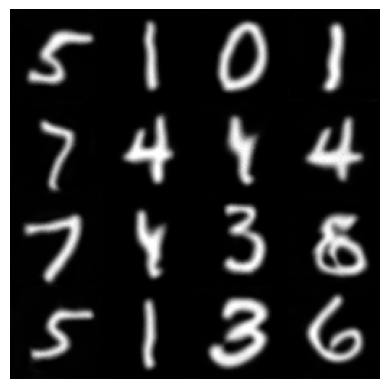

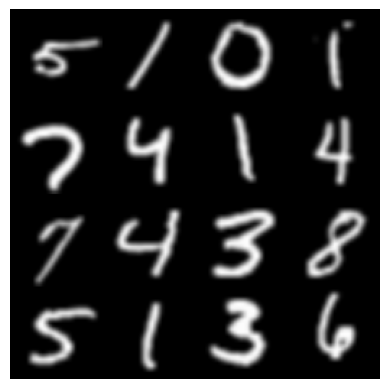

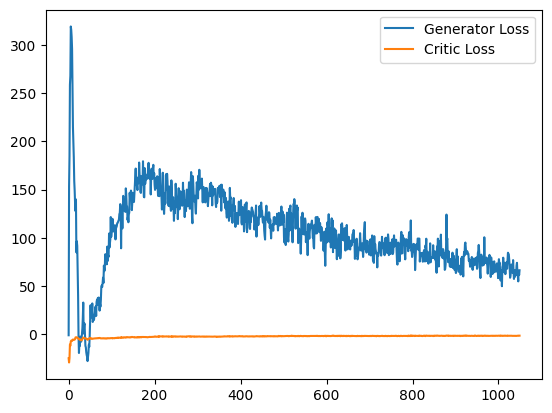

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45, step 21500: Generator loss: 68.73908441162109, critic loss: -1.3114245083108547


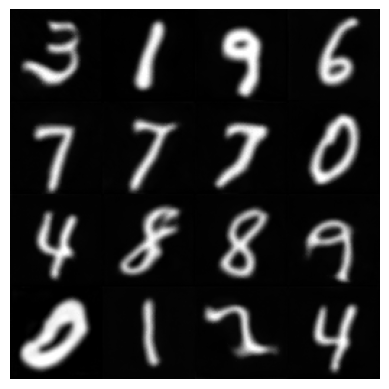

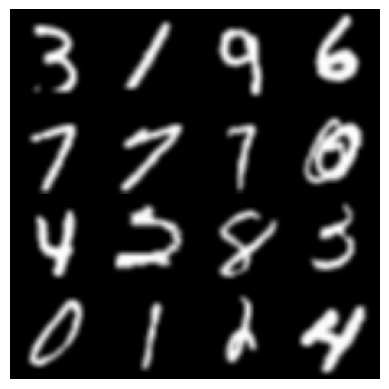

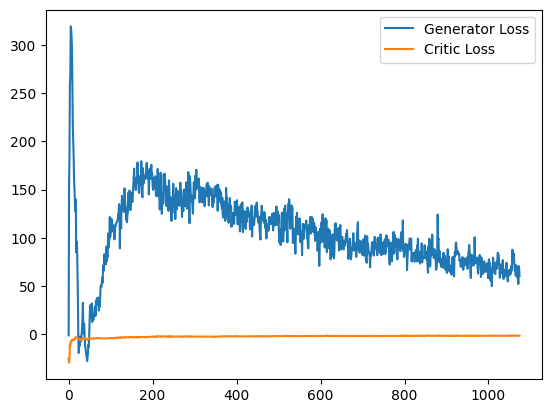

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 22000: Generator loss: 72.63065453720093, critic loss: -1.205878826782107


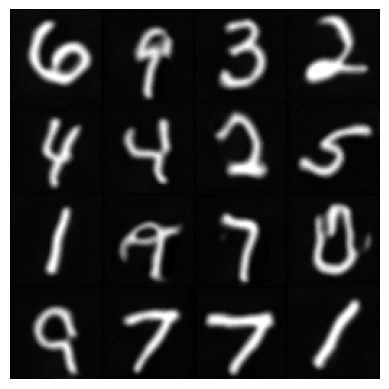

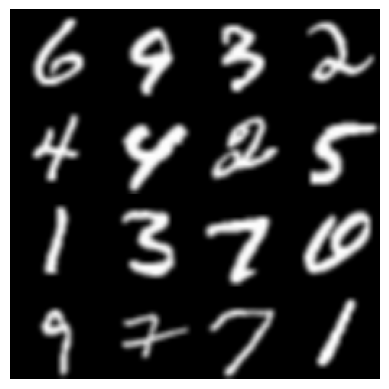

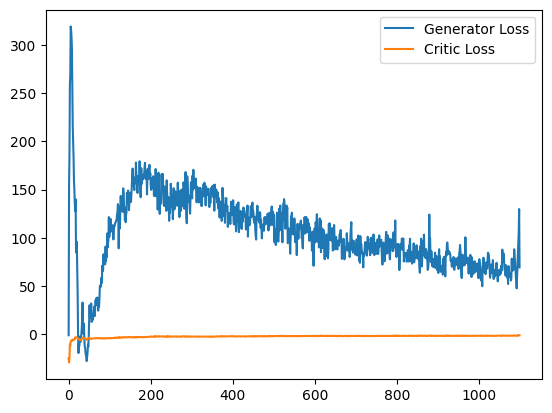

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47, step 22500: Generator loss: 108.1986925201416, critic loss: -0.9641930572148412


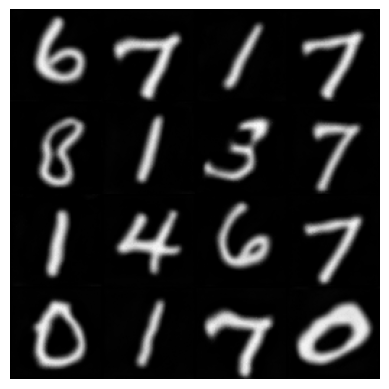

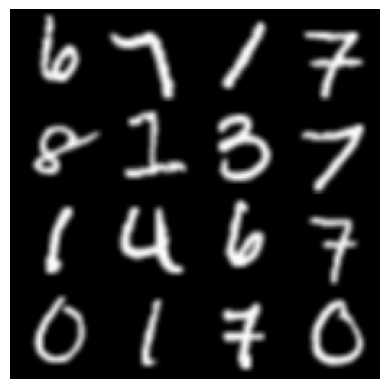

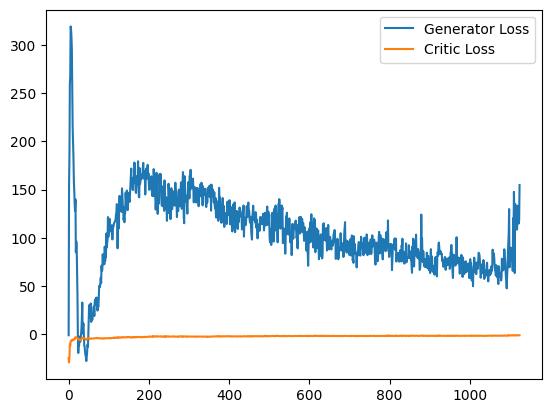

In [ ]:
cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)
        labels = labels.to(device)
        one_hot_labels = torch.nn.functional.one_hot(labels, num_classes=n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, 64, 64)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_truncated_noise(cur_batch_size, z_dim, truncation).to(device)
            fake_noise = combine_vectors(fake_noise, one_hot_labels)
            fake = gen(fake_noise)
            fake_image_and_labels = combine_vectors(fake.detach(), image_one_hot_labels)
            real_image_and_labels = combine_vectors(real, image_one_hot_labels)
            crit_fake_pred = crit(fake_image_and_labels)
            crit_real_pred = crit(real_image_and_labels)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real_image_and_labels, fake_image_and_labels, epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = combine_vectors(fake, image_one_hot_labels)
        crit_fake_pred = crit(fake_noise_2)

        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins),
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1


<div style='text-align: justify;'>
    
    As we can see from the last output of the training, we have high fidelity images that almost look similar to the real data. However, from the loss graph we can se a high spike at the end of the traning. This might happend that discriminator were able to distinguish accurately of real and fake images that made the generator loss spike. **Note**: The training process hasn't completed yet so the output above might not be the best generated images from the generator and there are still several hyperparameter tuning works to do.
</div>